## 1. Import Libraries

In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import FancyArrowPatch
from PIL import Image
import os
from collections import Counter, defaultdict
import random
import pandas as pd
import seaborn as sns
from pathlib import Path
import networkx as nx
import os

# Set style
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

print("✓ Libraries imported successfully")

✓ Libraries imported successfully


## 2. Load Dataset

In [2]:
# Đường dẫn đến dữ liệu
DATASET_ROOT = '../datasets/output_coco_relations'
ANNOTATIONS_FILE = os.path.join(DATASET_ROOT, 'annotations_with_relationships.json')
RELATIONSHIPS_FILE = os.path.join(DATASET_ROOT, 'relationships.json')
IMAGES_DIR = os.path.join(DATASET_ROOT, 'images')

print("Loading annotations...")
with open(ANNOTATIONS_FILE, 'r') as f:
    coco_data = json.load(f)

print("Loading relationships...")
with open(RELATIONSHIPS_FILE, 'r') as f:
    relationships_data = json.load(f)

print(f"\n✓ Data loaded successfully!")
print(f"  Images: {len(coco_data['images'])}")
print(f"  Annotations: {len(coco_data['annotations'])}")
print(f"  Categories: {len(coco_data['categories'])}")
print(f"  Relationships: {len(relationships_data['relationships'])}")

Loading annotations...
Loading relationships...

✓ Data loaded successfully!
  Images: 283
  Annotations: 5412
  Categories: 133
  Relationships: 4330


## 3. Process Data Structures

In [3]:
# Create mappings
categories = {cat['id']: cat['name'] for cat in coco_data['categories']}
images_dict = {img['id']: img for img in coco_data['images']}

# Group annotations by image
annotations_by_image = defaultdict(list)
for ann in coco_data['annotations']:
    annotations_by_image[ann['image_id']].append(ann)

# Group relationships by image
relationships_by_image = defaultdict(list)
for rel in relationships_data['relationships']:
    relationships_by_image[rel['image_id']].append(rel)

print(f"✓ Data structures created")
print(f"  Unique images with annotations: {len(annotations_by_image)}")
print(f"  Unique images with relationships: {len(relationships_by_image)}")
print(f"\nFirst 10 categories:")
for i, (cat_id, cat_name) in enumerate(list(categories.items())[:10]):
    print(f"  {cat_id}: {cat_name}")

✓ Data structures created
  Unique images with annotations: 283
  Unique images with relationships: 278

First 10 categories:
  1: person
  2: bicycle
  3: car
  4: motorcycle
  5: airplane
  6: bus
  7: train
  8: truck
  9: boat
  10: traffic light


## 4. Statistical Analysis

In [4]:
# Compute statistics
total_images = len(coco_data['images'])
total_annotations = len(coco_data['annotations'])
total_relationships = len(relationships_data['relationships'])

# Objects and relationships per image
objects_per_image = []
relationships_per_image = []
object_class_counts = Counter()
predicate_counts = Counter()

for img_id in images_dict.keys():
    num_objects = len(annotations_by_image.get(img_id, []))
    num_relationships = len(relationships_by_image.get(img_id, []))
    
    objects_per_image.append(num_objects)
    relationships_per_image.append(num_relationships)
    
    # Count object classes
    for ann in annotations_by_image.get(img_id, []):
        object_class_counts[ann['category_id']] += 1
    
    # Count predicates
    for rel in relationships_by_image.get(img_id, []):
        predicate_counts[rel['predicate']] += 1

print("="*60)
print("DATASET STATISTICS")
print("="*60)
print(f"Total images: {total_images}")
print(f"Total objects: {total_annotations}")
print(f"Total relationships: {total_relationships}")
print(f"\nAverage objects per image: {np.mean(objects_per_image):.2f} (±{np.std(objects_per_image):.2f})")
print(f"Average relationships per image: {np.mean(relationships_per_image):.2f} (±{np.std(relationships_per_image):.2f})")
print(f"\nMin/Max objects per image: {np.min(objects_per_image)} / {np.max(objects_per_image)}")
print(f"Min/Max relationships per image: {np.min(relationships_per_image)} / {np.max(relationships_per_image)}")
print(f"\nTotal unique object classes: {len(object_class_counts)}")
print(f"Total unique predicates: {len(predicate_counts)}")
print("="*60)

DATASET STATISTICS
Total images: 283
Total objects: 5412
Total relationships: 4330

Average objects per image: 19.12 (±14.08)
Average relationships per image: 15.30 (±12.83)

Min/Max objects per image: 3 / 71
Min/Max relationships per image: 0 / 57

Total unique object classes: 40
Total unique predicates: 17


## 5. Visualization: Distribution Plots

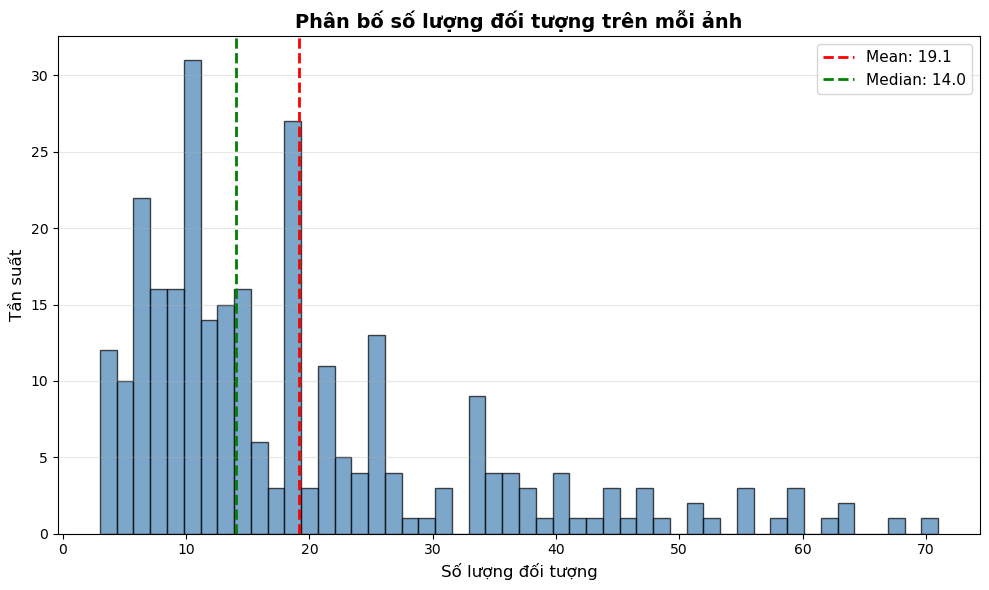

In [5]:
# Objects per image distribution
plt.figure(figsize=(10, 6))
plt.hist(objects_per_image, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
plt.xlabel('Số lượng đối tượng', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.title('Phân bố số lượng đối tượng trên mỗi ảnh', fontsize=14, fontweight='bold')
plt.axvline(np.mean(objects_per_image), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {np.mean(objects_per_image):.1f}')
plt.axvline(np.median(objects_per_image), color='green', linestyle='--', linewidth=2,
            label=f'Median: {np.median(objects_per_image):.1f}')
plt.legend(fontsize=11)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

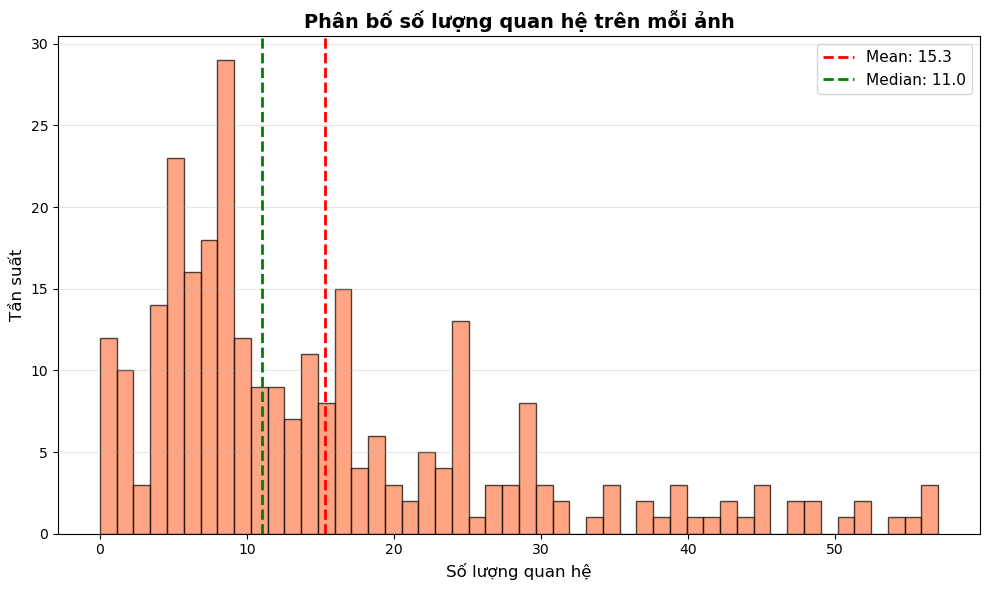

In [6]:
# Relationships per image distribution
plt.figure(figsize=(10, 6))
plt.hist(relationships_per_image, bins=50, edgecolor='black', alpha=0.7, color='coral')
plt.xlabel('Số lượng quan hệ', fontsize=12)
plt.ylabel('Tần suất', fontsize=12)
plt.title('Phân bố số lượng quan hệ trên mỗi ảnh', fontsize=14, fontweight='bold')
plt.axvline(np.mean(relationships_per_image), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {np.mean(relationships_per_image):.1f}')
plt.axvline(np.median(relationships_per_image), color='green', linestyle='--', linewidth=2,
            label=f'Median: {np.median(relationships_per_image):.1f}')
plt.legend(fontsize=11)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

## 6. Top Object Classes

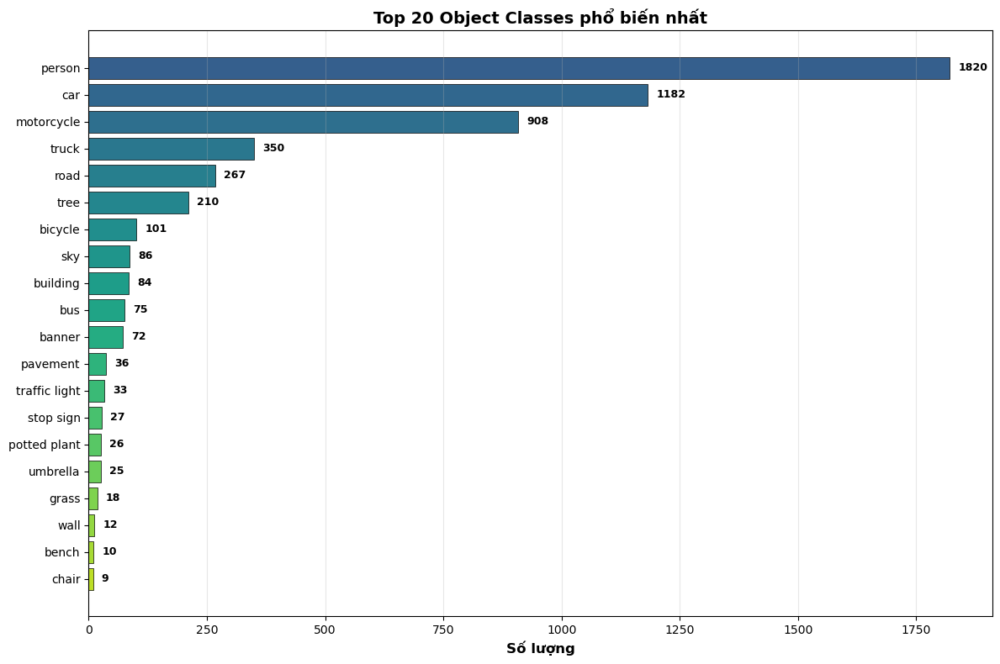


Top 20 Object Classes:
 1. person              :  1820 (33.63%)
 2. car                 :  1182 (21.84%)
 3. motorcycle          :   908 (16.78%)
 4. truck               :   350 ( 6.47%)
 5. road                :   267 ( 4.93%)
 6. tree                :   210 ( 3.88%)
 7. bicycle             :   101 ( 1.87%)
 8. sky                 :    86 ( 1.59%)
 9. building            :    84 ( 1.55%)
10. bus                 :    75 ( 1.39%)
11. banner              :    72 ( 1.33%)
12. pavement            :    36 ( 0.67%)
13. traffic light       :    33 ( 0.61%)
14. stop sign           :    27 ( 0.50%)
15. potted plant        :    26 ( 0.48%)
16. umbrella            :    25 ( 0.46%)
17. grass               :    18 ( 0.33%)
18. wall                :    12 ( 0.22%)
19. bench               :    10 ( 0.18%)
20. chair               :     9 ( 0.17%)


In [7]:
# Top 20 object classes
plt.figure(figsize=(12, 8))
top_objects = object_class_counts.most_common(20)
obj_names = [categories.get(obj_id, f'ID_{obj_id}') for obj_id, _ in top_objects]
obj_counts = [count for _, count in top_objects]

colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(obj_names)))
bars = plt.barh(obj_names, obj_counts, color=colors, edgecolor='black', linewidth=0.5)
plt.xlabel('Số lượng', fontsize=12, fontweight='bold')
plt.title('Top 20 Object Classes phổ biến nhất', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)

# Add value labels
for i, (bar, count) in enumerate(zip(bars, obj_counts)):
    plt.text(count + max(obj_counts)*0.01, bar.get_y() + bar.get_height()/2, 
             f'{count}', va='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

print("\nTop 20 Object Classes:")
for i, (obj_id, count) in enumerate(top_objects, 1):
    obj_name = categories.get(obj_id, f'ID_{obj_id}')
    percentage = (count / total_annotations) * 100
    print(f"{i:2d}. {obj_name:20s}: {count:5d} ({percentage:5.2f}%)")

## 7. Top Predicates (Relationships)

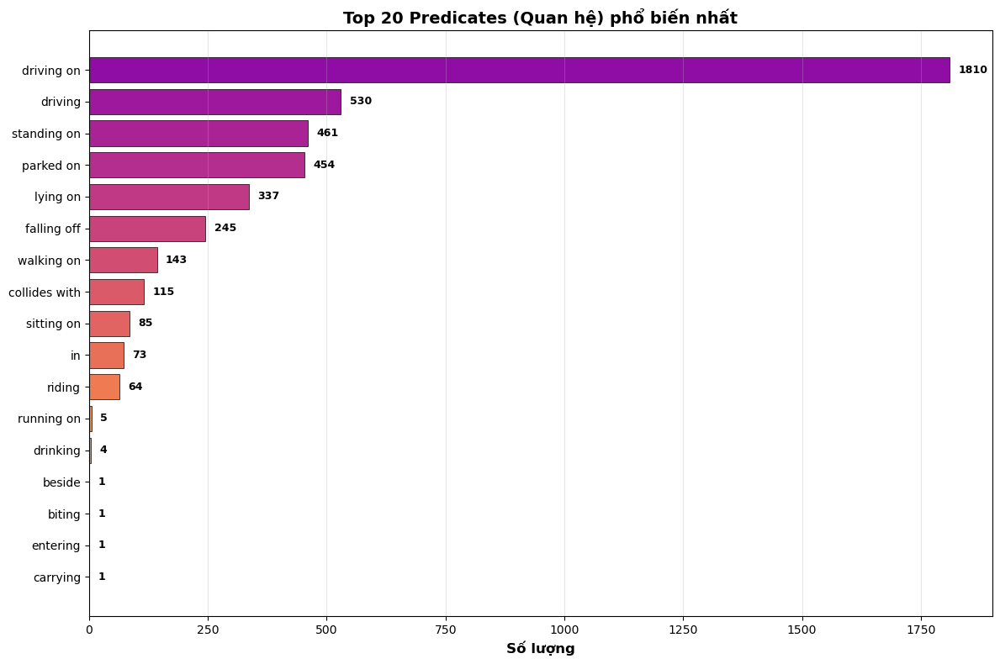


Top 20 Predicates:
 1. driving on          :  1810 (41.80%)
 2. driving             :   530 (12.24%)
 3. standing on         :   461 (10.65%)
 4. parked on           :   454 (10.48%)
 5. lying on            :   337 ( 7.78%)
 6. falling off         :   245 ( 5.66%)
 7. walking on          :   143 ( 3.30%)
 8. collides with       :   115 ( 2.66%)
 9. sitting on          :    85 ( 1.96%)
10. in                  :    73 ( 1.69%)
11. riding              :    64 ( 1.48%)
12. running on          :     5 ( 0.12%)
13. drinking            :     4 ( 0.09%)
14. beside              :     1 ( 0.02%)
15. biting              :     1 ( 0.02%)
16. entering            :     1 ( 0.02%)
17. carrying            :     1 ( 0.02%)


In [8]:
# Top 20 predicates
plt.figure(figsize=(12, 8))
top_predicates = predicate_counts.most_common(20)
pred_names = [pred for pred, _ in top_predicates]
pred_counts = [count for _, count in top_predicates]

colors = plt.cm.plasma(np.linspace(0.3, 0.9, len(pred_names)))
bars = plt.barh(pred_names, pred_counts, color=colors, edgecolor='black', linewidth=0.5)
plt.xlabel('Số lượng', fontsize=12, fontweight='bold')
plt.title('Top 20 Predicates (Quan hệ) phổ biến nhất', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)

# Add value labels
for i, (bar, count) in enumerate(zip(bars, pred_counts)):
    plt.text(count + max(pred_counts)*0.01, bar.get_y() + bar.get_height()/2, 
             f'{count}', va='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

print("\nTop 20 Predicates:")
for i, (pred, count) in enumerate(top_predicates, 1):
    percentage = (count / total_relationships) * 100
    print(f"{i:2d}. {pred:20s}: {count:5d} ({percentage:5.2f}%)")

## 8. Object-Predicate-Object Triplets Analysis

In [9]:
# Analyze most common triplets (subject-predicate-object)
triplet_counts = Counter()

for rel in relationships_data['relationships']:
    subj_cat = rel.get('subject_category', 'unknown')
    pred = rel['predicate']
    obj_cat = rel.get('object_category', 'unknown')
    
    triplet = f"{subj_cat} → {pred} → {obj_cat}"
    triplet_counts[triplet] += 1

print("\n" + "="*80)
print("TOP 30 COMMON RELATIONSHIP TRIPLETS (Subject → Predicate → Object)")
print("="*80)

for i, (triplet, count) in enumerate(triplet_counts.most_common(30), 1):
    percentage = (count / total_relationships) * 100
    print(f"{i:2d}. {triplet:50s}: {count:4d} ({percentage:5.2f}%)")

print("="*80)


TOP 30 COMMON RELATIONSHIP TRIPLETS (Subject → Predicate → Object)
 1. car → driving on → road                           :  814 (18.80%)
 2. motorcycle → driving on → road                    :  604 (13.95%)
 3. person → driving → motorcycle                     :  514 (11.87%)
 4. person → standing on → road                       :  434 (10.02%)
 5. truck → driving on → road                         :  223 ( 5.15%)
 6. car → parked on → road                            :  221 ( 5.10%)
 7. person → falling off → motorcycle                 :  191 ( 4.41%)
 8. person → lying on → road                          :  180 ( 4.16%)
 9. person → walking on → road                        :  134 ( 3.09%)
10. motorcycle → lying on → road                      :  125 ( 2.89%)
11. person → sitting on → road                        :   81 ( 1.87%)
12. truck → parked on → road                          :   71 ( 1.64%)
13. bicycle → driving on → road                       :   68 ( 1.57%)
14. motorcycle → parke

## 9. Predicate Distribution by Object Pairs

In [10]:
# Count relationships between object pairs
object_pair_relations = defaultdict(lambda: defaultdict(int))

for rel in relationships_data['relationships']:
    subj_cat = rel.get('subject_category', 'unknown')
    obj_cat = rel.get('object_category', 'unknown')
    pred = rel['predicate']
    
    key = f"{subj_cat} → {obj_cat}"
    object_pair_relations[key][pred] += 1

# Find most common object pairs and their relationships
sorted_pairs = sorted(object_pair_relations.items(), 
                     key=lambda x: sum(x[1].values()), reverse=True)[:20]

print("\n" + "="*80)
print("TOP 20 OBJECT PAIRS AND THEIR MOST COMMON RELATIONSHIPS")
print("="*80)

for i, (pair, preds) in enumerate(sorted_pairs, 1):
    total = sum(preds.values())
    print(f"\n{i}. {pair} ({total} relations)")
    top_preds = sorted(preds.items(), key=lambda x: x[1], reverse=True)[:5]
    for pred, count in top_preds:
        percentage = (count / total) * 100
        print(f"   - {pred:25s}: {count:4d} ({percentage:5.1f}%)")

print("\n" + "="*80)


TOP 20 OBJECT PAIRS AND THEIR MOST COMMON RELATIONSHIPS

1. car → road (1038 relations)
   - driving on               :  814 ( 78.4%)
   - parked on                :  221 ( 21.3%)
   - standing on              :    3 (  0.3%)

2. person → road (841 relations)
   - standing on              :  434 ( 51.6%)
   - lying on                 :  180 ( 21.4%)
   - walking on               :  134 ( 15.9%)
   - sitting on               :   81 (  9.6%)
   - running on               :    5 (  0.6%)

3. motorcycle → road (795 relations)
   - driving on               :  604 ( 76.0%)
   - lying on                 :  125 ( 15.7%)
   - parked on                :   61 (  7.7%)
   - standing on              :    3 (  0.4%)
   - collides with            :    1 (  0.1%)

4. person → motorcycle (762 relations)
   - driving                  :  514 ( 67.5%)
   - falling off              :  191 ( 25.1%)
   - in                       :   44 (  5.8%)
   - riding                   :    6 (  0.8%)
   - drinking    

## 10. Scene Graph Visualization Function

In [11]:
def visualize_scene_graph(image_id, max_relations=20, figsize=(16, 12)):
    """
    Visualize scene graph for a specific image
    
    Args:
        image_id: ID of the image to visualize
        max_relations: Maximum number of relationships to show
        figsize: Figure size (width, height)
    """
    if image_id not in images_dict:
        print(f"❌ Image ID {image_id} not found!")
        return
    
    img_info = images_dict[image_id]
    img_path = os.path.join(IMAGES_DIR, img_info['file_name'])
    
    if not os.path.exists(img_path):
        print(f"❌ Image file not found: {img_path}")
        return
    
    # Load image
    img = Image.open(img_path)
    img_array = np.array(img)
    
    # Get annotations and relationships
    annotations = annotations_by_image.get(image_id, [])
    relationships = relationships_by_image.get(image_id, [])
    
    # Create annotation ID to index mapping
    ann_id_to_idx = {ann['id']: idx for idx, ann in enumerate(annotations)}
    
    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(img_array)
    
    # Generate colors
    num_objects = len(annotations)
    colors = plt.cm.tab20(np.linspace(0, 1, max(num_objects, 20)))
    
    # Draw bounding boxes and labels
    bbox_centers = {}
    
    for idx, ann in enumerate(annotations):
        bbox = ann['bbox']  # [x, y, width, height]
        x, y, w, h = bbox
        
        category_name = categories.get(ann['category_id'], 'unknown')
        
        # Calculate center for relationships
        center_x = x + w / 2
        center_y = y + h / 2
        bbox_centers[ann['id']] = (center_x, center_y)
        
        # Draw bounding box
        color = colors[idx % len(colors)]
        rect = patches.Rectangle((x, y), w, h, 
                                linewidth=2.5, edgecolor=color, 
                                facecolor='none', linestyle='-')
        ax.add_patch(rect)
        
        # Add label
        label = f'{idx}: {category_name}'
        ax.text(x, y - 5, label, 
               bbox=dict(boxstyle='round,pad=0.4', facecolor=color, alpha=0.8),
               fontsize=10, color='white', weight='bold')
    
    # Draw relationships
    relations_to_show = relationships[:max_relations]
    
    for rel in relations_to_show:
        subj_id = rel['subject_id']
        obj_id = rel['object_id']
        predicate = rel['predicate']
        
        if subj_id not in bbox_centers or obj_id not in bbox_centers:
            continue
        
        start_pos = bbox_centers[subj_id]
        end_pos = bbox_centers[obj_id]
        
        # Draw arrow
        arrow = FancyArrowPatch(start_pos, end_pos,
                              arrowstyle='->', mutation_scale=25,
                              linewidth=2.5, color='red', alpha=0.7,
                              connectionstyle="arc3,rad=0.3")
        ax.add_patch(arrow)
        
        # Add predicate label
        mid_x = (start_pos[0] + end_pos[0]) / 2
        mid_y = (start_pos[1] + end_pos[1]) / 2
        ax.text(mid_x, mid_y, predicate,
               bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.8, edgecolor='red', linewidth=1.5),
               fontsize=9, color='black', weight='bold')
    
    # Set title
    title = f"Image: {img_info['file_name']} (ID: {image_id})\n"
    title += f"Objects: {len(annotations)}, Relationships: {len(relationships)}"
    if len(relationships) > max_relations:
        title += f" (showing {max_relations})"
    
    ax.set_title(title, fontsize=14, weight='bold', pad=20)
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print relationships
    if relationships:
        print("\n" + "="*80)
        print(f"RELATIONSHIPS (showing {min(len(relationships), max_relations)} of {len(relationships)})")
        print("="*80)
        
        for i, rel in enumerate(relations_to_show, 1):
            subj_cat = rel.get('subject_category', 'unknown')
            obj_cat = rel.get('object_category', 'unknown')
            pred = rel['predicate']
            
            subj_idx = ann_id_to_idx.get(rel['subject_id'], '?')
            obj_idx = ann_id_to_idx.get(rel['object_id'], '?')
            
            print(f"{i:3d}. [{subj_idx}] {subj_cat:15s} --[{pred:20s}]--> [{obj_idx}] {obj_cat:15s}")
        
        if len(relationships) > max_relations:
            print(f"\n... and {len(relationships) - max_relations} more relationships")
        print("="*80)

print("✓ Visualization function defined")

✓ Visualization function defined


## 11. Visualize Sample Images

In [12]:
# Find images with good number of objects and relationships
good_images = []
for img_id in images_dict.keys():
    num_objects = len(annotations_by_image.get(img_id, []))
    num_relationships = len(relationships_by_image.get(img_id, []))
    
    if num_objects >= 3 and num_relationships >= 3:
        good_images.append((img_id, num_objects, num_relationships))

# Sort by number of relationships
good_images.sort(key=lambda x: x[2], reverse=True)

print(f"Found {len(good_images)} images with at least 3 objects and 3 relationships")
print(f"\nTop 10 images by number of relationships:")
for i, (img_id, num_obj, num_rel) in enumerate(good_images[:10], 1):
    img_name = images_dict[img_id]['file_name']
    print(f"{i:2d}. Image {img_id:5d} ({img_name:30s}): {num_obj:3d} objects, {num_rel:3d} relationships")

Found 261 images with at least 3 objects and 3 relationships

Top 10 images by number of relationships:
 1. Image   246 (000000582176.jpg              ):  71 objects,  57 relationships
 2. Image   251 (000000582181.jpg              ):  63 objects,  57 relationships
 3. Image   247 (000000582177.jpg              ):  68 objects,  56 relationships
 4. Image   248 (000000582178.jpg              ):  62 objects,  55 relationships
 5. Image   252 (000000582182.jpg              ):  59 objects,  54 relationships
 6. Image   191 (000000582121.jpg              ):  56 objects,  52 relationships
 7. Image   249 (000000582179.jpg              ):  63 objects,  52 relationships
 8. Image   188 (000000582118.jpg              ):  60 objects,  51 relationships
 9. Image   190 (000000582120.jpg              ):  51 objects,  49 relationships
10. Image   243 (000000582173.jpg              ):  58 objects,  48 relationships



Visualizing image with most relationships (ID: 71)



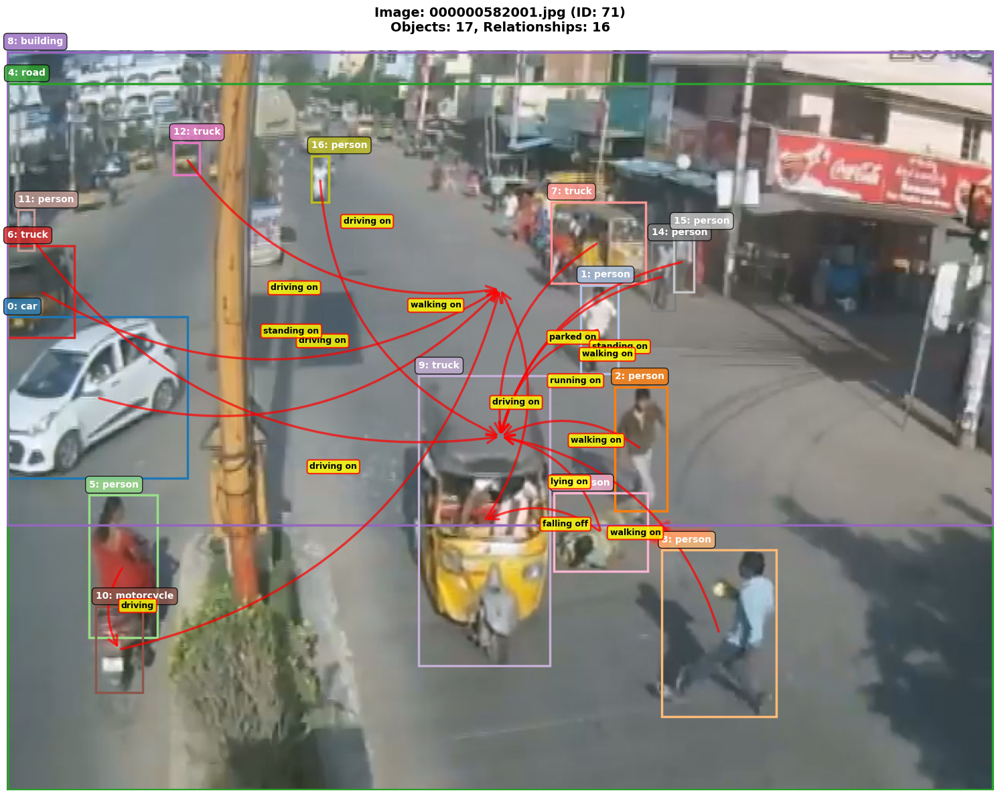


RELATIONSHIPS (showing 16 of 16)
  1. [7] truck           --[parked on           ]--> [4] road           
  2. [9] truck           --[driving on          ]--> [8] building       
  3. [12] truck           --[driving on          ]--> [8] building       
  4. [6] truck           --[driving on          ]--> [8] building       
  5. [0] car             --[driving on          ]--> [8] building       
  6. [10] motorcycle      --[driving on          ]--> [8] building       
  7. [15] person          --[standing on         ]--> [4] road           
  8. [11] person          --[standing on         ]--> [4] road           
  9. [1] person          --[running on          ]--> [4] road           
 10. [3] person          --[walking on          ]--> [4] road           
 11. [2] person          --[walking on          ]--> [4] road           
 12. [14] person          --[walking on          ]--> [4] road           
 13. [16] person          --[walking on          ]--> [4] road           
 14. [13] p

In [13]:
# Visualize the image with most relationships
if good_images:
    top_image_id = good_images[0][1]
    print(f"\nVisualizing image with most relationships (ID: {top_image_id})\n")
    visualize_scene_graph(top_image_id, max_relations=25)

## 12. Visualize Specific Image by ID

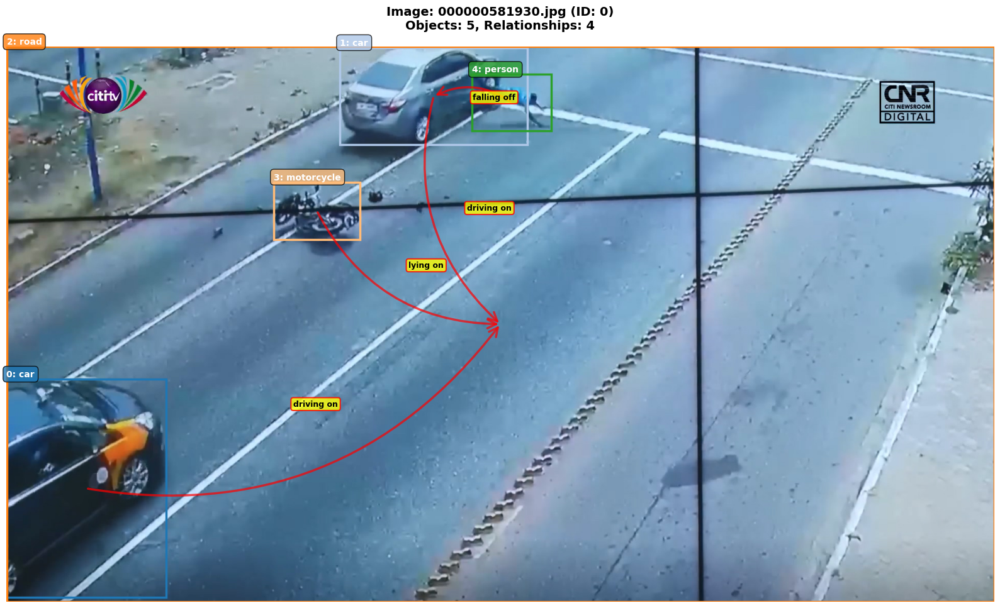


RELATIONSHIPS (showing 4 of 4)
  1. [0] car             --[driving on          ]--> [2] road           
  2. [1] car             --[driving on          ]--> [2] road           
  3. [3] motorcycle      --[lying on            ]--> [2] road           
  4. [4] person          --[falling off         ]--> [1] car            


In [14]:
# Change this to visualize a specific image
IMAGE_ID = 0  # Change this value

visualize_scene_graph(IMAGE_ID, max_relations=20)

## 13. Visualize Random Samples


SAMPLE 1/3


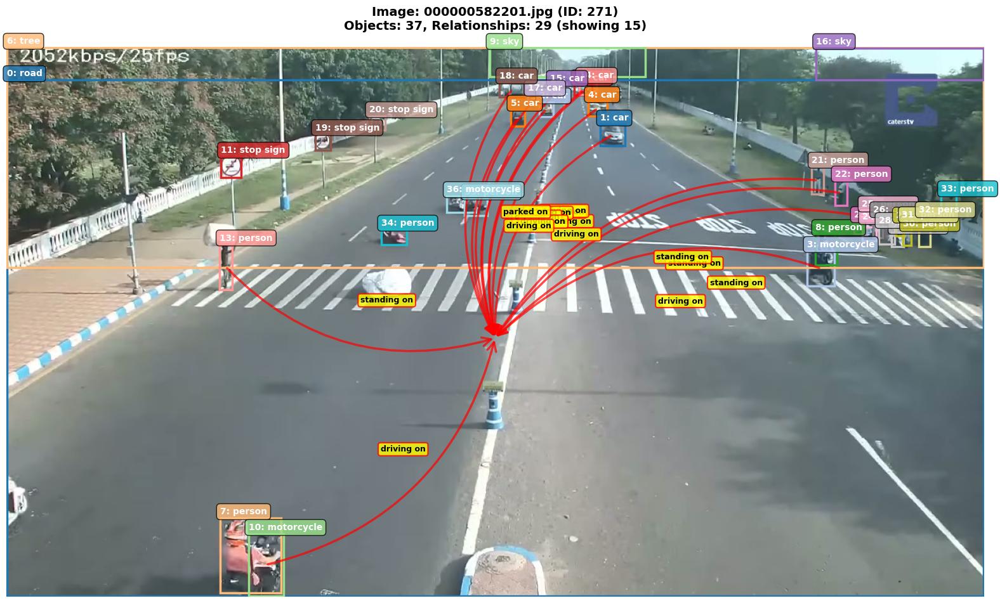


RELATIONSHIPS (showing 15 of 29)
  1. [1] car             --[driving on          ]--> [0] road           
  2. [4] car             --[driving on          ]--> [0] road           
  3. [12] car             --[driving on          ]--> [0] road           
  4. [14] car             --[driving on          ]--> [0] road           
  5. [15] car             --[driving on          ]--> [0] road           
  6. [17] car             --[driving on          ]--> [0] road           
  7. [2] car             --[driving on          ]--> [0] road           
  8. [5] car             --[driving on          ]--> [0] road           
  9. [3] motorcycle      --[driving on          ]--> [0] road           
 10. [10] motorcycle      --[driving on          ]--> [0] road           
 11. [18] car             --[parked on           ]--> [0] road           
 12. [13] person          --[standing on         ]--> [0] road           
 13. [32] person          --[standing on         ]--> [0] road           
 14. [22]

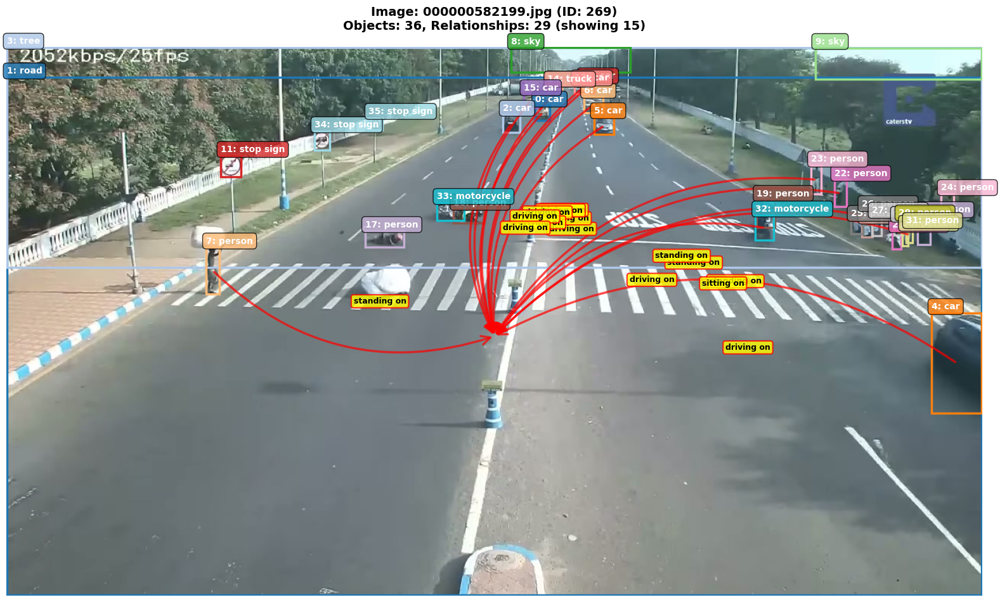


RELATIONSHIPS (showing 15 of 29)
  1. [4] car             --[driving on          ]--> [1] road           
  2. [32] motorcycle      --[driving on          ]--> [1] road           
  3. [5] car             --[driving on          ]--> [1] road           
  4. [6] car             --[driving on          ]--> [1] road           
  5. [12] car             --[driving on          ]--> [1] road           
  6. [13] car             --[driving on          ]--> [1] road           
  7. [10] car             --[driving on          ]--> [1] road           
  8. [0] car             --[driving on          ]--> [1] road           
  9. [15] car             --[driving on          ]--> [1] road           
 10. [2] car             --[driving on          ]--> [1] road           
 11. [7] person          --[standing on         ]--> [1] road           
 12. [16] person          --[standing on         ]--> [1] road           
 13. [22] person          --[standing on         ]--> [1] road           
 14. [23] 

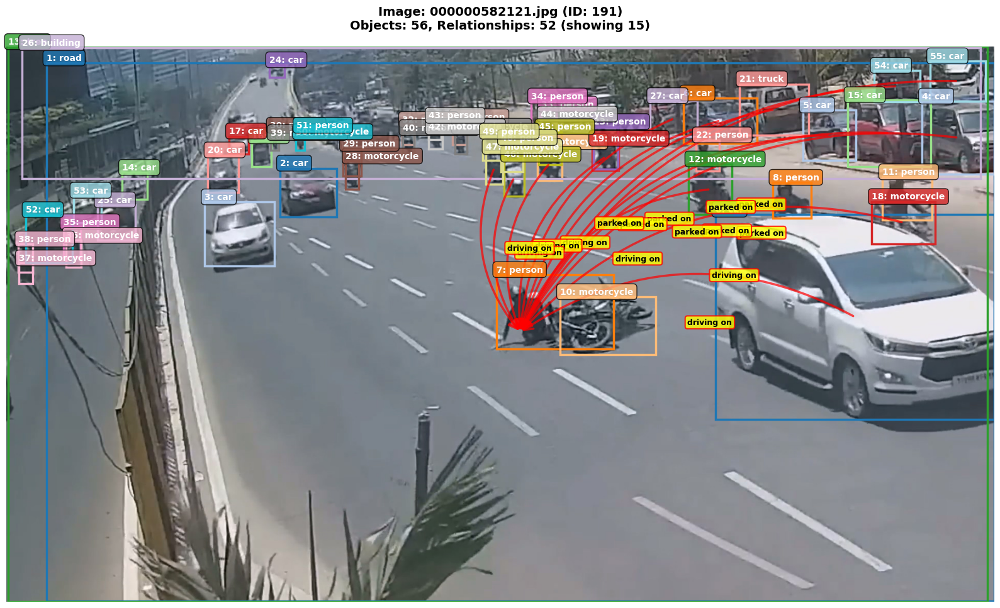


RELATIONSHIPS (showing 15 of 52)
  1. [4] car             --[parked on           ]--> [1] road           
  2. [55] car             --[parked on           ]--> [1] road           
  3. [15] car             --[parked on           ]--> [1] road           
  4. [54] car             --[parked on           ]--> [1] road           
  5. [5] car             --[parked on           ]--> [1] road           
  6. [21] truck           --[parked on           ]--> [1] road           
  7. [6] car             --[parked on           ]--> [1] road           
  8. [27] car             --[parked on           ]--> [1] road           
  9. [0] car             --[driving on          ]--> [1] road           
 10. [18] motorcycle      --[driving on          ]--> [1] road           
 11. [12] motorcycle      --[driving on          ]--> [1] road           
 12. [19] motorcycle      --[driving on          ]--> [1] road           
 13. [9] motorcycle      --[driving on          ]--> [1] road           
 14. [46]

In [15]:
# Visualize 3 random images with good content
num_samples = 3
if len(good_images) >= num_samples:
    sample_images = random.sample(good_images[:50], num_samples)  # Sample from top 50
    
    for i, (img_id, num_obj, num_rel) in enumerate(sample_images, 1):
        print(f"\n{'='*80}")
        print(f"SAMPLE {i}/{num_samples}")
        print(f"{'='*80}")
        visualize_scene_graph(img_id, max_relations=15)
else:
    print("Not enough images to sample from")

## 14. Export Statistics to JSON

In [16]:
# Create comprehensive statistics report
report = {
    'dataset_info': {
        'total_images': total_images,
        'total_objects': total_annotations,
        'total_relationships': total_relationships,
        'num_categories': len(categories),
        'num_unique_predicates': len(predicate_counts)
    },
    'averages': {
        'avg_objects_per_image': float(np.mean(objects_per_image)),
        'avg_relationships_per_image': float(np.mean(relationships_per_image)),
        'std_objects_per_image': float(np.std(objects_per_image)),
        'std_relationships_per_image': float(np.std(relationships_per_image))
    },
    'top_20_objects': [
        {'id': obj_id, 'name': categories.get(obj_id, f'ID_{obj_id}'), 'count': count} 
        for obj_id, count in object_class_counts.most_common(20)
    ],
    'top_20_predicates': [
        {'predicate': pred, 'count': count} 
        for pred, count in predicate_counts.most_common(20)
    ],
    'top_20_triplets': [
        {'triplet': triplet, 'count': count} 
        for triplet, count in triplet_counts.most_common(20)
    ]
}

# Save report
output_file = 'custom_dataset_statistics.json'
with open(output_file, 'w') as f:
    json.dump(report, f, indent=2)

print(f"✓ Statistics saved to: {output_file}")
print(f"\nReport summary:")
print(f"  - Dataset info: {len(report['dataset_info'])} metrics")
print(f"  - Top objects: {len(report['top_20_objects'])} classes")
print(f"  - Top predicates: {len(report['top_20_predicates'])} types")
print(f"  - Top triplets: {len(report['top_20_triplets'])} combinations")

✓ Statistics saved to: custom_dataset_statistics.json

Report summary:
  - Dataset info: 5 metrics
  - Top objects: 20 classes
  - Top predicates: 17 types
  - Top triplets: 20 combinations


## 15. Create Combined Visualization

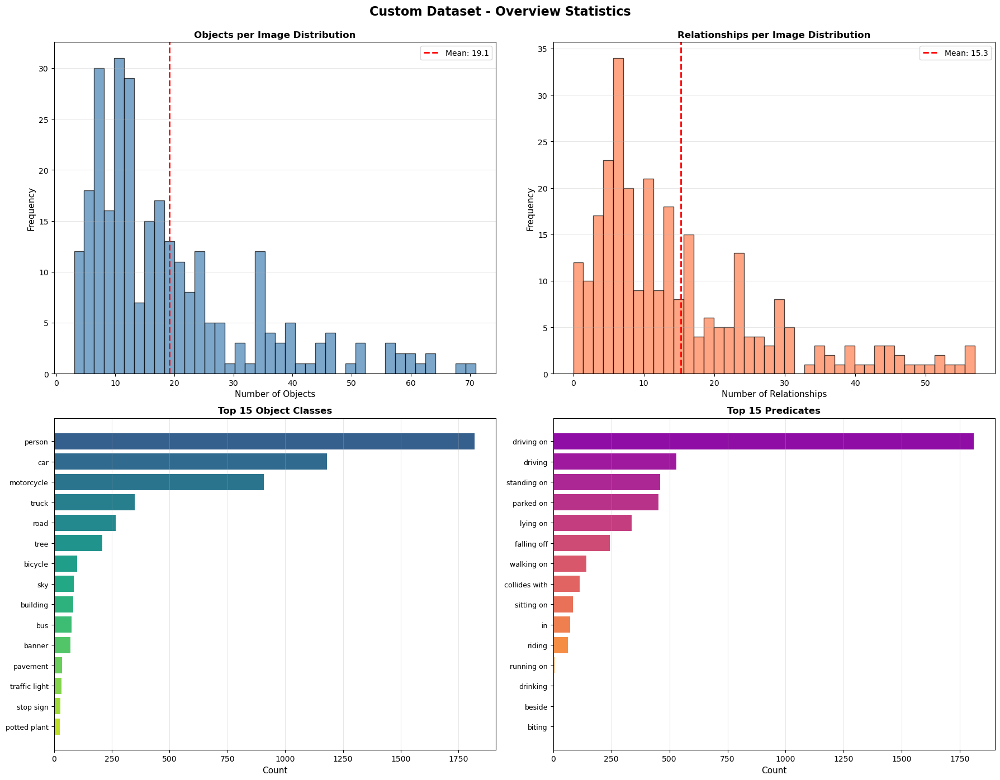

✓ Combined visualization saved as 'custom_dataset_overview.png'


In [17]:
# Create a 2x2 subplot with key statistics
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('Custom Dataset - Overview Statistics', fontsize=16, fontweight='bold', y=0.995)

# 1. Objects per image
ax = axes[0, 0]
ax.hist(objects_per_image, bins=40, edgecolor='black', alpha=0.7, color='steelblue')
ax.axvline(np.mean(objects_per_image), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(objects_per_image):.1f}')
ax.set_xlabel('Number of Objects', fontsize=11)
ax.set_ylabel('Frequency', fontsize=11)
ax.set_title('Objects per Image Distribution', fontsize=12, fontweight='bold')
ax.legend()
ax.grid(axis='y', alpha=0.3)

# 2. Relationships per image
ax = axes[0, 1]
ax.hist(relationships_per_image, bins=40, edgecolor='black', alpha=0.7, color='coral')
ax.axvline(np.mean(relationships_per_image), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(relationships_per_image):.1f}')
ax.set_xlabel('Number of Relationships', fontsize=11)
ax.set_ylabel('Frequency', fontsize=11)
ax.set_title('Relationships per Image Distribution', fontsize=12, fontweight='bold')
ax.legend()
ax.grid(axis='y', alpha=0.3)

# 3. Top 15 object classes
ax = axes[1, 0]
top_15_objects = object_class_counts.most_common(15)
obj_names_15 = [categories.get(obj_id, f'ID_{obj_id}') for obj_id, _ in top_15_objects]
obj_counts_15 = [count for _, count in top_15_objects]
y_pos = np.arange(len(obj_names_15))
ax.barh(y_pos, obj_counts_15, color=plt.cm.viridis(np.linspace(0.3, 0.9, len(obj_names_15))))
ax.set_yticks(y_pos)
ax.set_yticklabels(obj_names_15, fontsize=9)
ax.set_xlabel('Count', fontsize=11)
ax.set_title('Top 15 Object Classes', fontsize=12, fontweight='bold')
ax.invert_yaxis()
ax.grid(axis='x', alpha=0.3)

# 4. Top 15 predicates
ax = axes[1, 1]
top_15_preds = predicate_counts.most_common(15)
pred_names_15 = [pred for pred, _ in top_15_preds]
pred_counts_15 = [count for _, count in top_15_preds]
y_pos = np.arange(len(pred_names_15))
ax.barh(y_pos, pred_counts_15, color=plt.cm.plasma(np.linspace(0.3, 0.9, len(pred_names_15))))
ax.set_yticks(y_pos)
ax.set_yticklabels(pred_names_15, fontsize=9)
ax.set_xlabel('Count', fontsize=11)
ax.set_title('Top 15 Predicates', fontsize=12, fontweight='bold')
ax.invert_yaxis()
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('custom_dataset_overview.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Combined visualization saved as 'custom_dataset_overview.png'")

## 16. Scene Graph Visualization with NetworkX

## Summary

Notebook này đã thực hiện:

1. ✅ Load dataset custom từ `datasets/output_coco_relations`
2. ✅ Phân tích thống kê về objects và relationships
3. ✅ Visualize phân bố số lượng objects và relationships
4. ✅ Phân tích top object classes và predicates
5. ✅ Phân tích relationship triplets (subject-predicate-object)
6. ✅ Tạo function để visualize scene graphs với bounding boxes và relationships
7. ✅ Export statistics ra JSON file
8. ✅ Tạo combined visualization overview

Bạn có thể:
- Thay đổi `IMAGE_ID` trong cell 12 để xem ảnh cụ thể
- Chạy lại cell 13 để xem các sample ngẫu nhiên khác
- Điều chỉnh `max_relations` để hiển thị nhiều/ít relationships hơn

In [18]:
def draw_scene_graph_network(image_id, ax, max_nodes=30, max_edges=40):
    """
    Vẽ scene graph dạng network với networkx
    
    Args:
        image_id: ID of the image
        ax: Matplotlib axis để vẽ
        max_nodes: Số lượng nodes tối đa
        max_edges: Số lượng edges tối đa
    """
    if image_id not in images_dict:
        print(f"❌ Image ID {image_id} not found!")
        return None
    
    # Get annotations and relationships
    annotations = annotations_by_image.get(image_id, [])[:max_nodes]
    relationships = relationships_by_image.get(image_id, [])
    
    # Create directed graph
    G = nx.MultiDiGraph()
    
    # Create annotation ID to index mapping
    ann_id_to_idx = {ann['id']: idx for idx, ann in enumerate(annotations)}
    
    # Add nodes with attributes
    node_labels = {}
    for idx, ann in enumerate(annotations):
        category_name = categories.get(ann['category_id'], 'unknown')
        G.add_node(idx, label=category_name, category=ann['category_id'])
        node_labels[idx] = f"{idx}_{category_name}"
    
    # Add edges (relationships)
    edge_labels = {}
    edges_added = 0
    
    for rel in relationships:
        if edges_added >= max_edges:
            break
        
        subj_id = rel['subject_id']
        obj_id = rel['object_id']
        predicate = rel['predicate']
        
        # Convert annotation IDs to indices
        subj_idx = ann_id_to_idx.get(subj_id)
        obj_idx = ann_id_to_idx.get(obj_id)
        
        # Only add if both nodes exist
        if subj_idx is not None and obj_idx is not None:
            G.add_edge(subj_idx, obj_idx, predicate=predicate)
            edge_labels[(subj_idx, obj_idx)] = predicate
            edges_added += 1
    
    # Layout - use different layouts based on graph size
    if len(G.nodes()) < 15:
        pos = nx.spring_layout(G, k=2, iterations=50, seed=42)
    else:
        pos = nx.kamada_kawai_layout(G)
    
    # Draw nodes
    node_colors = plt.cm.Set3(np.linspace(0, 1, max(len(G.nodes()), 1)))
    if len(G.nodes()) > 0:
        nx.draw_networkx_nodes(G, pos, ax=ax,
                              node_color=node_colors,
                              node_size=2000,
                              alpha=0.9,
                              edgecolors='black',
                              linewidths=2)
    
    # Draw edges with curved arrows
    for edge in G.edges():
        start_node, end_node = edge
        
        start_pos = pos[start_node]
        end_pos = pos[end_node]
        
        # Add curvature
        rad = 0.3
        
        arrow = FancyArrowPatch(
            start_pos, end_pos,
            arrowstyle='-|>',
            connectionstyle=f"arc3,rad={rad}",
            mutation_scale=25,
            linewidth=2,
            color='darkblue',
            alpha=0.6,
            zorder=1
        )
        ax.add_patch(arrow)
    
    # Draw node labels
    for node, (x, y) in pos.items():
        label = node_labels[node]
        ax.text(x, y, label,
               fontsize=9,
               ha='center',
               va='center',
               fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.3',
                        facecolor='white',
                        edgecolor='black',
                        linewidth=1.5,
                        alpha=0.9),
               zorder=2)
    
    # Draw edge labels (predicates)
    edge_labels_drawn = {}
    for (start, end), label in edge_labels.items():
        if (start, end) not in edge_labels_drawn:
            start_pos = pos[start]
            end_pos = pos[end]
            
            # Calculate midpoint with offset for curved edge
            mid_x = (start_pos[0] + end_pos[0]) / 2
            mid_y = (start_pos[1] + end_pos[1]) / 2
            
            # Offset perpendicular to edge
            dx = end_pos[0] - start_pos[0]
            dy = end_pos[1] - start_pos[1]
            norm = np.sqrt(dx**2 + dy**2)
            if norm > 0:
                offset_x = -dy / norm * 0.1
                offset_y = dx / norm * 0.1
            else:
                offset_x, offset_y = 0, 0
            
            ax.text(mid_x + offset_x, mid_y + offset_y, label,
                   fontsize=7,
                   ha='center',
                   va='center',
                   bbox=dict(boxstyle='round,pad=0.2',
                            facecolor='yellow',
                            edgecolor='orange',
                            alpha=0.8,
                            linewidth=1),
                   zorder=3)
            
            edge_labels_drawn[(start, end)] = True
    
    ax.axis('off')
    ax.set_title('Scene Graph Network', fontsize=12, fontweight='bold', pad=10)
    
    return G

print("✓ Scene graph network function defined")

✓ Scene graph network function defined


## 17. Complete Scene Visualization (Image + Graph)

In [19]:
def visualize_complete_scene(image_id, max_relations=30):
    """
    Trực quan hóa đầy đủ: ảnh với bounding boxes + scene graph
    
    Args:
        image_id: ID of the image to visualize
        max_relations: Số lượng relationships tối đa để hiển thị
    """
    if image_id not in images_dict:
        print(f"❌ Image ID {image_id} not found!")
        return
    
    img_info = images_dict[image_id]
    img_path = os.path.join(IMAGES_DIR, img_info['file_name'])
    
    if not os.path.exists(img_path):
        print(f"❌ Image file not found: {img_path}")
        return
    
    # Load image
    img = Image.open(img_path)
    img_array = np.array(img)
    
    # Get annotations and relationships
    annotations = annotations_by_image.get(image_id, [])
    relationships = relationships_by_image.get(image_id, [])
    
    # Create figure with two subplots
    fig = plt.figure(figsize=(20, 10))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1], wspace=0.3)
    
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])
    
    # Left: Image with bounding boxes
    ax1.imshow(img_array)
    
    # Generate colors
    num_objects = len(annotations)
    colors = plt.cm.tab20(np.linspace(0, 1, max(num_objects, 20)))
    
    # Create annotation ID to index mapping
    ann_id_to_idx = {ann['id']: idx for idx, ann in enumerate(annotations)}
    
    # Draw bounding boxes (limit to first 30)
    for idx, ann in enumerate(annotations[:30]):
        bbox = ann['bbox']  # [x, y, width, height]
        x, y, w, h = bbox
        
        category_name = categories.get(ann['category_id'], 'unknown')
        
        # Draw bounding box
        color = colors[idx % len(colors)]
        rect = patches.Rectangle((x, y), w, h,
                                linewidth=3, edgecolor=color,
                                facecolor='none', linestyle='-')
        ax1.add_patch(rect)
        
        # Add label
        label = f'{idx}_{category_name}'
        ax1.text(x, y - 5, label,
               bbox=dict(boxstyle='round,pad=0.4', facecolor=color, alpha=0.8),
               fontsize=10, color='white', weight='bold')
    
    # Set title for image
    title = f"Image: {img_info['file_name']} (ID: {image_id})\\n"
    title += f"Objects: {len(annotations)}, Relationships: {len(relationships)}"
    ax1.set_title(title, fontsize=12, weight='bold')
    ax1.axis('off')
    
    # Right: Scene Graph
    draw_scene_graph_network(image_id, ax2, max_nodes=30, max_edges=max_relations)
    
    plt.tight_layout()
    plt.show()
    
    # Print relationships
    print("\\n" + "="*80)
    print(f"RELATIONSHIPS (showing {min(len(relationships), max_relations)} of {len(relationships)})")
    print("="*80)
    
    relations_to_show = relationships[:max_relations]
    
    for i, rel in enumerate(relations_to_show, 1):
        subj_cat = rel.get('subject_category', 'unknown')
        obj_cat = rel.get('object_category', 'unknown')
        pred = rel['predicate']
        
        subj_idx = ann_id_to_idx.get(rel['subject_id'], '?')
        obj_idx = ann_id_to_idx.get(rel['object_id'], '?')
        
        print(f"{i:3d}. [{subj_idx}] {subj_cat:15s} --[{pred:20s}]--> [{obj_idx}] {obj_cat:15s}")
    
    if len(relationships) > max_relations:
        print(f"\\n... and {len(relationships) - max_relations} more relationships")
    print("="*80)

print("✓ Complete scene visualization function defined")

✓ Complete scene visualization function defined


## 18. Visualize Complete Scene - Examples

Visualizing image with most relationships (ID: 246)\n


/tmp/ipykernel_974/3334838957.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


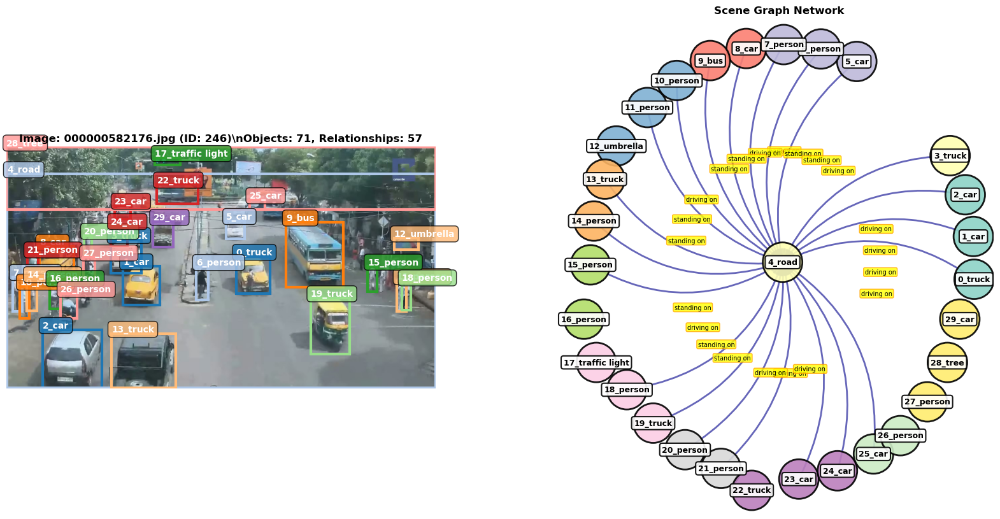

\n================================================================================
RELATIONSHIPS (showing 30 of 57)
  1. [8] car             --[parked on           ]--> [4] road           
  2. [33] car             --[parked on           ]--> [4] road           
  3. [13] truck           --[driving on          ]--> [4] road           
  4. [2] car             --[driving on          ]--> [4] road           
  5. [31] motorcycle      --[driving on          ]--> [4] road           
  6. [40] bicycle         --[driving on          ]--> [4] road           
  7. [36] motorcycle      --[driving on          ]--> [4] road           
  8. [39] motorcycle      --[driving on          ]--> [4] road           
  9. [1] car             --[driving on          ]--> [4] road           
 10. [3] truck           --[driving on          ]--> [4] road           
 11. [24] car             --[driving on          ]--> [4] road           
 12. [23] car             --[driving on          ]--> [4] road           


In [20]:
# Visualize the image with most relationships
if good_images:
    top_image_id = good_images[0][0]
    print(f"Visualizing image with most relationships (ID: {top_image_id})\\n")
    visualize_complete_scene(top_image_id, max_relations=30)

/tmp/ipykernel_974/3334838957.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


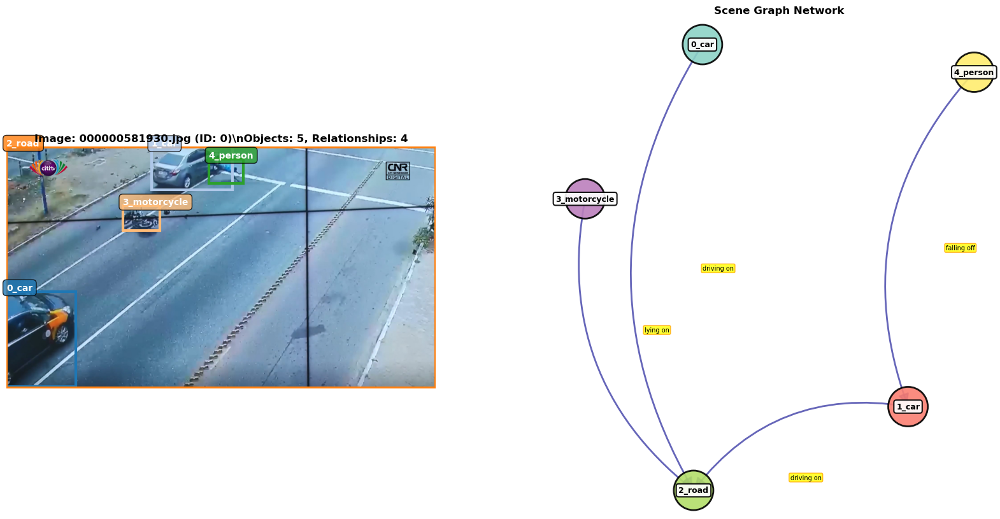

\n================================================================================
RELATIONSHIPS (showing 4 of 4)
  1. [0] car             --[driving on          ]--> [2] road           
  2. [1] car             --[driving on          ]--> [2] road           
  3. [3] motorcycle      --[lying on            ]--> [2] road           
  4. [4] person          --[falling off         ]--> [1] car            


In [21]:
# Visualize a specific image by ID
SAMPLE_IMAGE_ID = 0  # Change this value

visualize_complete_scene(SAMPLE_IMAGE_ID, max_relations=25)

## 19. Graph-Only Visualization

In [22]:
def visualize_graph_only(image_id, max_nodes=30, max_edges=50, figsize=(16, 12)):
    """
    Chỉ vẽ scene graph, không hiển thị ảnh
    
    Args:
        image_id: ID of the image
        max_nodes: Maximum number of nodes
        max_edges: Maximum number of edges
        figsize: Figure size
    """
    if image_id not in images_dict:
        print(f"❌ Image ID {image_id} not found!")
        return
    
    img_info = images_dict[image_id]
    annotations = annotations_by_image.get(image_id, [])
    relationships = relationships_by_image.get(image_id, [])
    
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    
    # Draw scene graph
    draw_scene_graph_network(image_id, ax, max_nodes=max_nodes, max_edges=max_edges)
    
    # Add overall title
    title = f"Scene Graph: {img_info['file_name']} (ID: {image_id})\\n"
    title += f"Nodes: {min(len(annotations), max_nodes)}, "
    title += f"Edges: {min(len(relationships), max_edges)}"
    fig.suptitle(title, fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

print("✓ Graph-only visualization function defined")

✓ Graph-only visualization function defined


Visualizing scene graph for image ID: 246\n


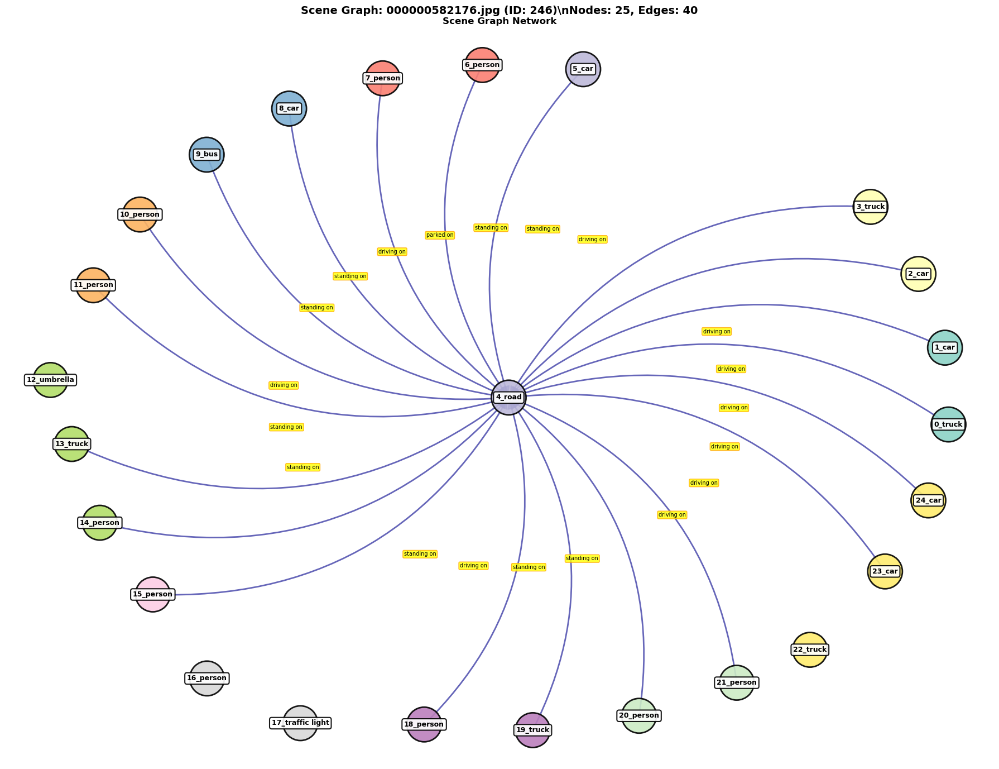

In [23]:
# Visualize large graph only
if good_images:
    sample_id = good_images[0][0]
    print(f"Visualizing scene graph for image ID: {sample_id}\\n")
    visualize_graph_only(sample_id, max_nodes=25, max_edges=40, figsize=(18, 14))

## 20. Compare Multiple Scene Graphs

In [24]:
def compare_scene_graphs(image_ids, num_graphs=4):
    """
    Vẽ nhiều scene graphs để so sánh
    
    Args:
        image_ids: List of (image_id, num_objects, num_relationships) tuples
        num_graphs: Number of graphs to display
    """
    images_to_show = image_ids[:num_graphs]
    
    # Calculate grid size
    cols = 2
    rows = (num_graphs + 1) // 2
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10 * rows))
    axes = axes.flatten() if num_graphs > 1 else [axes]
    
    for idx, (ax, (img_id, num_obj, num_rel)) in enumerate(zip(axes, images_to_show)):
        if img_id in images_dict:
            draw_scene_graph_network(img_id, ax, max_nodes=20, max_edges=25)
            img_name = images_dict[img_id]['file_name']
            ax.set_title(f"Graph {idx+1}: {img_name}\\n"
                        f"Objects: {num_obj}, Relations: {num_rel}",
                        fontsize=11, fontweight='bold')
    
    # Hide unused subplots
    for idx in range(len(images_to_show), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✓ Graph comparison function defined")

✓ Graph comparison function defined


Comparing top 4 images with most relationships:\n


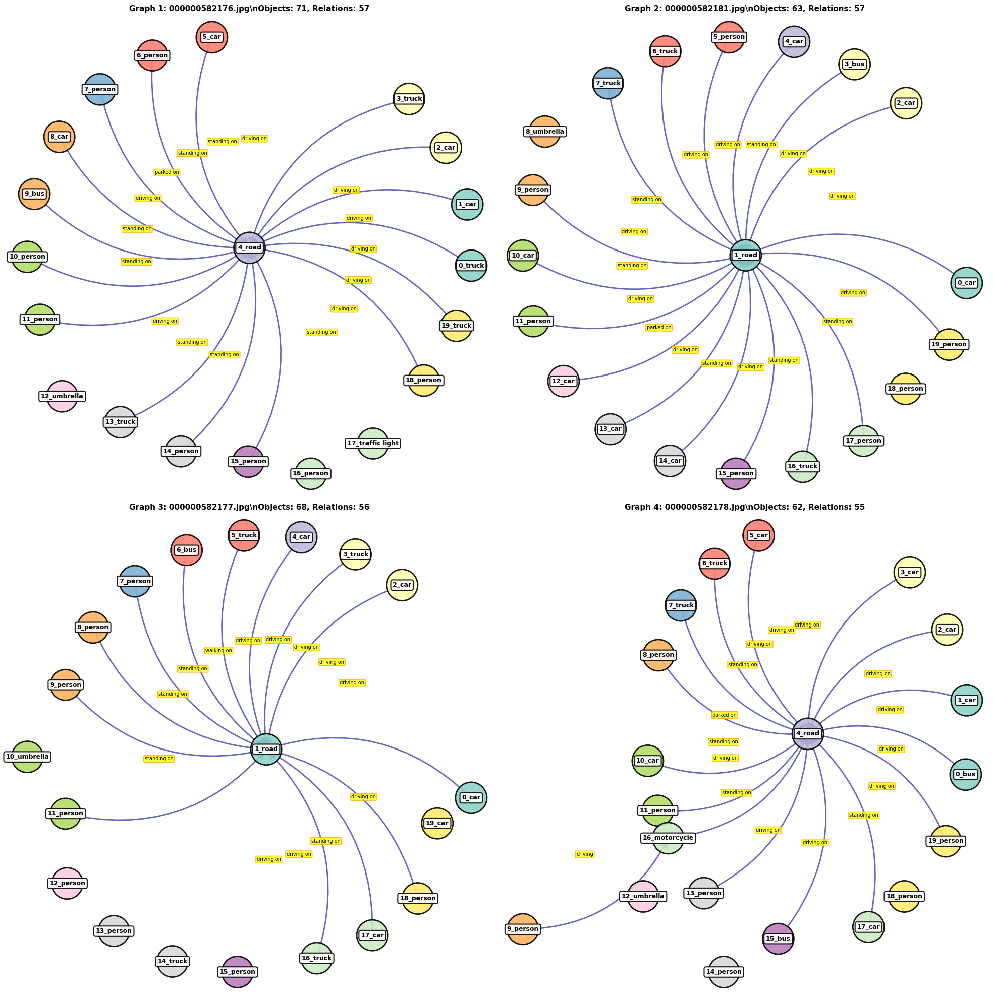

In [25]:
# Compare 4 scene graphs with most relationships
if len(good_images) >= 4:
    print("Comparing top 4 images with most relationships:\\n")
    compare_scene_graphs(good_images, num_graphs=4)
else:
    print(f"Not enough images. Found only {len(good_images)} images.")

## 21. Find Most Complex Scene Graphs

TOP 10 MOST COMPLEX SCENE GRAPHS
 1. ID   246 - 000000582176.jpg              :  71 objects,  57 relations, complexity:   4047
 2. ID   247 - 000000582177.jpg              :  68 objects,  56 relations, complexity:   3808
 3. ID   251 - 000000582181.jpg              :  63 objects,  57 relations, complexity:   3591
 4. ID   248 - 000000582178.jpg              :  62 objects,  55 relations, complexity:   3410
 5. ID   249 - 000000582179.jpg              :  63 objects,  52 relations, complexity:   3276
 6. ID   252 - 000000582182.jpg              :  59 objects,  54 relations, complexity:   3186
 7. ID   188 - 000000582118.jpg              :  60 objects,  51 relations, complexity:   3060
 8. ID   191 - 000000582121.jpg              :  56 objects,  52 relations, complexity:   2912
 9. ID   243 - 000000582173.jpg              :  58 objects,  48 relations, complexity:   2784
10. ID   187 - 000000582117.jpg              :  56 objects,  47 relations, complexity:   2632
\n=========================

/tmp/ipykernel_974/3334838957.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


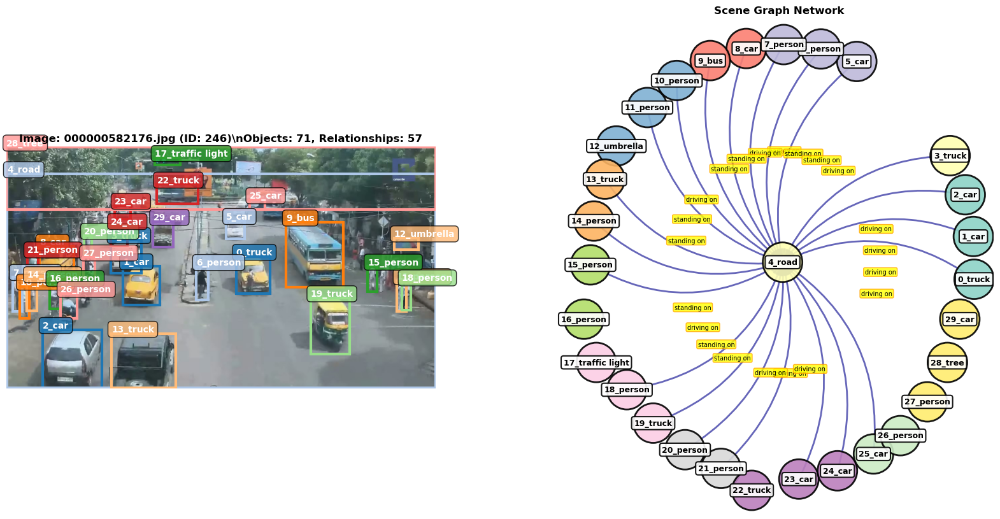

\n================================================================================
RELATIONSHIPS (showing 40 of 57)
  1. [8] car             --[parked on           ]--> [4] road           
  2. [33] car             --[parked on           ]--> [4] road           
  3. [13] truck           --[driving on          ]--> [4] road           
  4. [2] car             --[driving on          ]--> [4] road           
  5. [31] motorcycle      --[driving on          ]--> [4] road           
  6. [40] bicycle         --[driving on          ]--> [4] road           
  7. [36] motorcycle      --[driving on          ]--> [4] road           
  8. [39] motorcycle      --[driving on          ]--> [4] road           
  9. [1] car             --[driving on          ]--> [4] road           
 10. [3] truck           --[driving on          ]--> [4] road           
 11. [24] car             --[driving on          ]--> [4] road           
 12. [23] car             --[driving on          ]--> [4] road           


In [26]:
# Tìm các scene graphs phức tạp nhất (nhiều nodes và edges)
complexity_scores = []
for img_id in images_dict.keys():
    num_objects = len(annotations_by_image.get(img_id, []))
    num_relationships = len(relationships_by_image.get(img_id, []))
    score = num_objects * num_relationships
    complexity_scores.append((score, img_id, num_objects, num_relationships))

# Sort by complexity
complexity_scores.sort(reverse=True, key=lambda x: x[0])

print("="*80)
print("TOP 10 MOST COMPLEX SCENE GRAPHS")
print("="*80)
for i, (score, img_id, num_obj, num_rel) in enumerate(complexity_scores[:10], 1):
    img_name = images_dict[img_id]['file_name']
    print(f"{i:2d}. ID {img_id:5d} - {img_name:30s}: "
          f"{num_obj:3d} objects, {num_rel:3d} relations, complexity: {score:6d}")

print("\\n" + "="*80)
print("Visualizing most complex scene graph:")
print("="*80)
if complexity_scores:
    most_complex = complexity_scores[0]
    visualize_complete_scene(most_complex[1], max_relations=40)

## 22. Export Scene Graph to JSON

In [27]:
def export_scene_graph_json(image_id, output_file):
    """
    Export scene graph ra file JSON với định dạng dễ đọc
    
    Args:
        image_id: ID of the image
        output_file: Path to output JSON file
    """
    if image_id not in images_dict:
        print(f"❌ Image ID {image_id} not found!")
        return
    
    img_info = images_dict[image_id]
    annotations = annotations_by_image.get(image_id, [])
    relationships = relationships_by_image.get(image_id, [])
    
    # Create annotation ID to index mapping
    ann_id_to_idx = {ann['id']: idx for idx, ann in enumerate(annotations)}
    
    graph_data = {
        'image_id': image_id,
        'image_file': img_info['file_name'],
        'width': img_info.get('width', 0),
        'height': img_info.get('height', 0),
        'nodes': [],
        'edges': []
    }
    
    # Add nodes
    for idx, ann in enumerate(annotations):
        category_name = categories.get(ann['category_id'], 'unknown')
        
        graph_data['nodes'].append({
            'id': idx,
            'annotation_id': ann['id'],
            'class': category_name,
            'category_id': ann['category_id'],
            'bbox': ann['bbox']
        })
    
    # Add edges
    for rel in relationships:
        subj_id = rel['subject_id']
        obj_id = rel['object_id']
        predicate = rel['predicate']
        
        subj_idx = ann_id_to_idx.get(subj_id)
        obj_idx = ann_id_to_idx.get(obj_id)
        
        if subj_idx is not None and obj_idx is not None:
            subj_cat = rel.get('subject_category', 'unknown')
            obj_cat = rel.get('object_category', 'unknown')
            
            graph_data['edges'].append({
                'subject_id': subj_idx,
                'subject_class': subj_cat,
                'predicate': predicate,
                'object_id': obj_idx,
                'object_class': obj_cat
            })
    
    with open(output_file, 'w') as f:
        json.dump(graph_data, f, indent=2)
    
    print(f"✓ Scene graph exported to: {output_file}")
    print(f"  Nodes: {len(graph_data['nodes'])}")
    print(f"  Edges: {len(graph_data['edges'])}")

print("✓ Export function defined")

✓ Export function defined


In [28]:
# Export a sample scene graph
if good_images:
    sample_id = good_images[0][0]
    output_filename = f'scene_graph_image_{sample_id}.json'
    print(f"Exporting scene graph for image ID {sample_id}:\\n")
    export_scene_graph_json(sample_id, output_filename)

Exporting scene graph for image ID 246:\n
✓ Scene graph exported to: scene_graph_image_246.json
  Nodes: 71
  Edges: 57


## 23. Visualize Multiple Complete Scenes

\n====================================================================================================
SAMPLE 1/5 - Image ID: 248


/tmp/ipykernel_974/3334838957.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


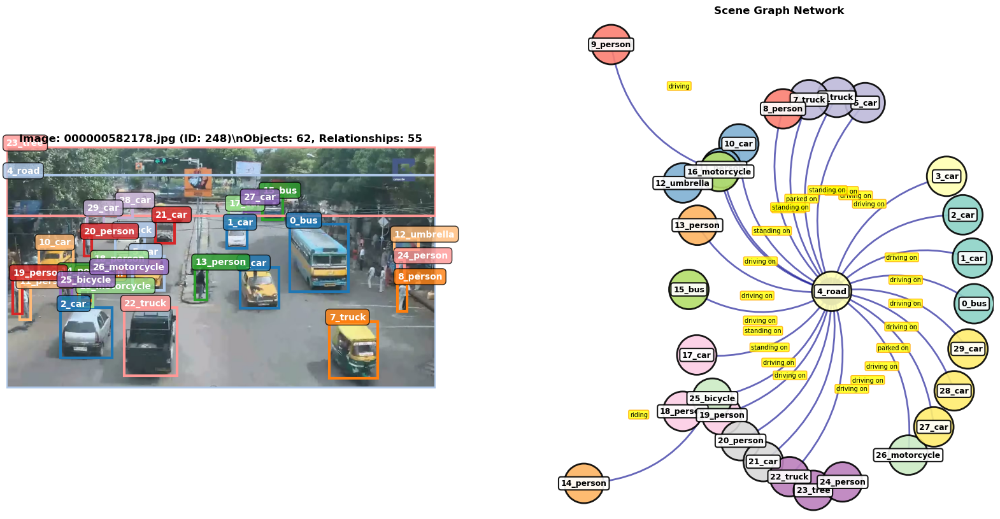

\n================================================================================
RELATIONSHIPS (showing 25 of 55)
  1. [10] car             --[parked on           ]--> [4] road           
  2. [29] car             --[parked on           ]--> [4] road           
  3. [22] truck           --[driving on          ]--> [4] road           
  4. [2] car             --[driving on          ]--> [4] road           
  5. [16] motorcycle      --[driving on          ]--> [4] road           
  6. [25] bicycle         --[driving on          ]--> [4] road           
  7. [26] motorcycle      --[driving on          ]--> [4] road           
  8. [5] car             --[driving on          ]--> [4] road           
  9. [6] truck           --[driving on          ]--> [4] road           
 10. [56] motorcycle      --[driving on          ]--> [4] road           
 11. [21] car             --[driving on          ]--> [4] road           
 12. [31] car             --[driving on          ]--> [4] road           

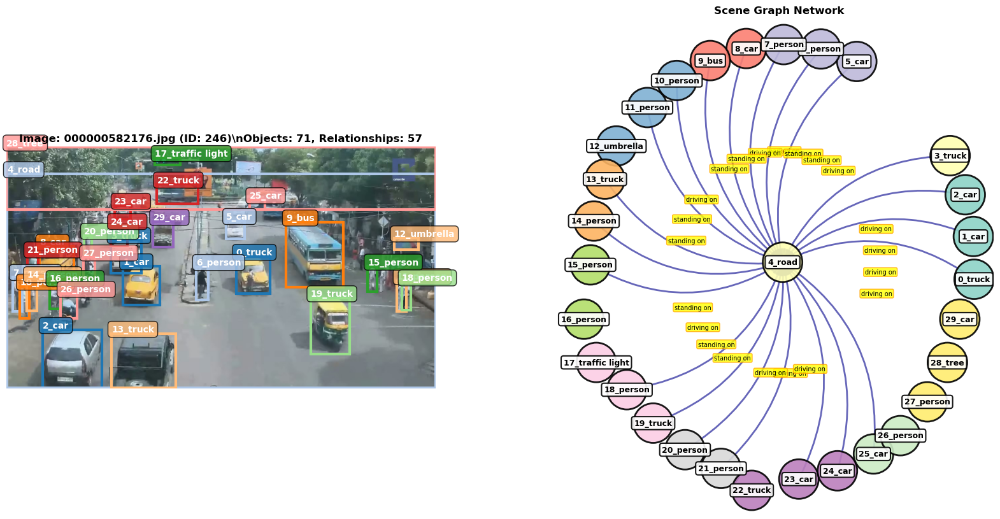

\n================================================================================
RELATIONSHIPS (showing 25 of 57)
  1. [8] car             --[parked on           ]--> [4] road           
  2. [33] car             --[parked on           ]--> [4] road           
  3. [13] truck           --[driving on          ]--> [4] road           
  4. [2] car             --[driving on          ]--> [4] road           
  5. [31] motorcycle      --[driving on          ]--> [4] road           
  6. [40] bicycle         --[driving on          ]--> [4] road           
  7. [36] motorcycle      --[driving on          ]--> [4] road           
  8. [39] motorcycle      --[driving on          ]--> [4] road           
  9. [1] car             --[driving on          ]--> [4] road           
 10. [3] truck           --[driving on          ]--> [4] road           
 11. [24] car             --[driving on          ]--> [4] road           
 12. [23] car             --[driving on          ]--> [4] road           


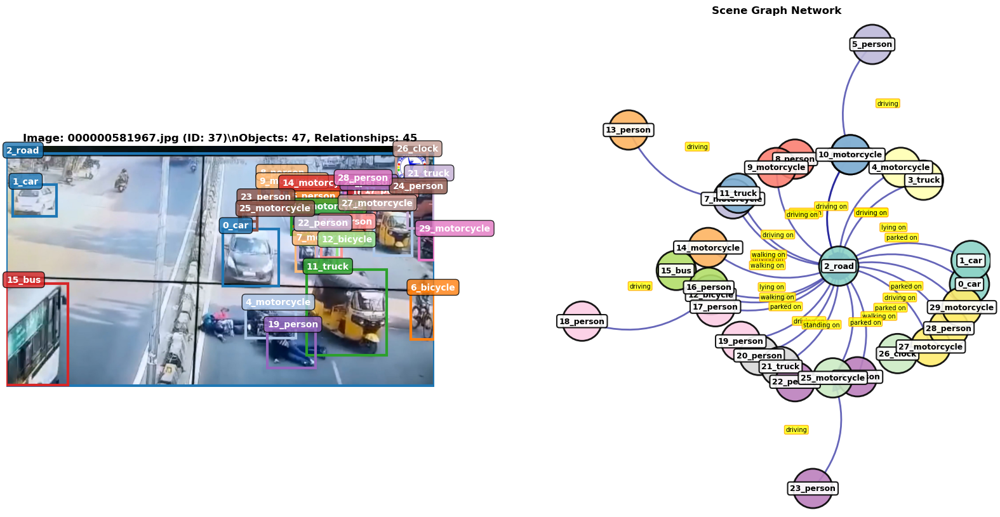

\n================================================================================
RELATIONSHIPS (showing 25 of 45)
  1. [29] motorcycle      --[parked on           ]--> [2] road           
  2. [3] truck           --[parked on           ]--> [2] road           
  3. [21] truck           --[parked on           ]--> [2] road           
  4. [1] car             --[parked on           ]--> [2] road           
  5. [30] motorcycle      --[parked on           ]--> [2] road           
  6. [6] bicycle         --[driving on          ]--> [2] road           
  7. [11] truck           --[driving on          ]--> [2] road           
  8. [12] bicycle         --[driving on          ]--> [2] road           
  9. [7] motorcycle      --[driving on          ]--> [2] road           
 10. [0] car             --[driving on          ]--> [2] road           
 11. [10] motorcycle      --[driving on          ]--> [2] road           
 12. [25] motorcycle      --[driving on          ]--> [2] road           
 

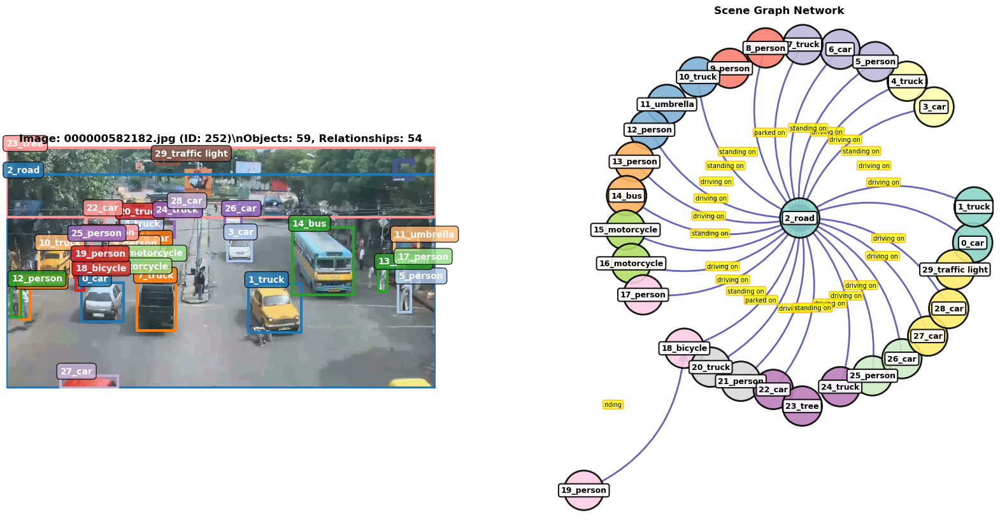

\n================================================================================
RELATIONSHIPS (showing 25 of 54)
  1. [10] truck           --[parked on           ]--> [2] road           
  2. [22] car             --[parked on           ]--> [2] road           
  3. [27] car             --[driving on          ]--> [2] road           
  4. [7] truck           --[driving on          ]--> [2] road           
  5. [0] car             --[driving on          ]--> [2] road           
  6. [16] motorcycle      --[driving on          ]--> [2] road           
  7. [18] bicycle         --[driving on          ]--> [2] road           
  8. [15] motorcycle      --[driving on          ]--> [2] road           
  9. [33] motorcycle      --[driving on          ]--> [2] road           
 10. [6] car             --[driving on          ]--> [2] road           
 11. [4] truck           --[driving on          ]--> [2] road           
 12. [24] truck           --[driving on          ]--> [2] road           


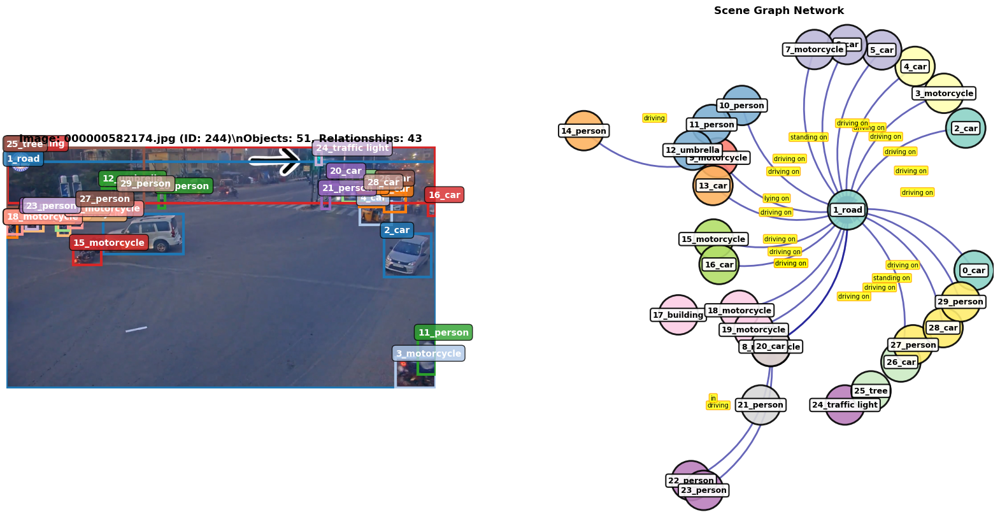

\n================================================================================
RELATIONSHIPS (showing 25 of 43)
  1. [3] motorcycle      --[driving on          ]--> [1] road           
  2. [2] car             --[driving on          ]--> [1] road           
  3. [16] car             --[driving on          ]--> [1] road           
  4. [42] motorcycle      --[driving on          ]--> [1] road           
  5. [41] motorcycle      --[driving on          ]--> [1] road           
  6. [5] car             --[driving on          ]--> [1] road           
  7. [4] car             --[driving on          ]--> [1] road           
  8. [6] car             --[driving on          ]--> [1] road           
  9. [26] car             --[driving on          ]--> [1] road           
 10. [28] car             --[driving on          ]--> [1] road           
 11. [47] car             --[driving on          ]--> [1] road           
 12. [48] car             --[driving on          ]--> [1] road           
 

In [29]:
# Visualize 3 random complete scenes
num_samples = 5
if len(good_images) >= num_samples:
    sample_images = random.sample(good_images[:20], num_samples)  # Sample from top 20
    
    for i, (img_id, num_obj, num_rel) in enumerate(sample_images, 1):
        print(f"\\n{'='*100}")
        print(f"SAMPLE {i}/{num_samples} - Image ID: {img_id}")
        print(f"{'='*100}")
        visualize_complete_scene(img_id, max_relations=25)
else:
    print(f"Not enough images to sample from. Found only {len(good_images)} images.")